In [1]:
#import des librairies nécessaires
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
sns.set()

In [2]:
data = pd.read_csv(filepath_or_buffer=r'C:\Users\mehdi\Downloads\Openfoodfacts\OpenFoodFactsFrenchProductsOnly.csv', delimiter=",",low_memory=False)

In [3]:
data.head()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,3087.0,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,17-09-16 11:17,1474103893,17-09-16 11:18,Farine de blé noir,NaN,1kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,24600.0,http://world-fr.openfoodfacts.org/produit/0000...,date-limite-app,1434530704,17-06-15 10:45,1434535914,17-06-15 12:11,Filet de bœuf,NaN,2.46 kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,27205.0,http://world-fr.openfoodfacts.org/produit/0000...,tacinte,1458238630,17-03-16 19:17,1458238638,17-03-16 19:17,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,36252.0,http://world-fr.openfoodfacts.org/produit/0000...,tacinte,1422221701,25-01-15 22:35,1489055667,09-03-17 11:34,Lion Peanut x2,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,22.0,22.0,NaN,NaN
4,39259.0,http://world-fr.openfoodfacts.org/produit/0000...,tacinte,1422221773,25-01-15 22:36,1473538082,10-09-16 22:08,Twix x2,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
data.shape

(98440, 162)

In [5]:
data.describe()

,code,created_t,last_modified_t,cities,allergens_fr,no_nutriments,additives_n,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_that_may_be_from_palm_oil_n,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
count,9.844000e+04,9.844000e+04,9.844000e+04,0.0,0.0,0.0,53466.000000,53454.000000,0.0,53454.000000,...,40.000000,2964.000000,165.000000,681.000000,0.0,176.000000,61403.000000,61403.000000,0.0,0.0
mean,1.243397e+34,1.447215e+09,1.468599e+09,NaN,NaN,NaN,1.856619,0.069854,NaN,0.148296,...,6.559910,31.616218,15.412121,49.159031,NaN,366.265368,8.683289,8.362946,NaN,NaN
std,3.340570e+36,4.051780e+07,2.574637e+07,NaN,NaN,NaN,2.561405,0.258620,NaN,0.450815,...,1.672411,32.060094,3.753028,19.210493,NaN,403.553375,9.045915,9.384044,NaN,NaN
min,1.000000e+00,0.000000e+00,1.333873e+09,NaN,NaN,NaN,0.000000,0.000000,NaN,0.000000,...,0.000000,0.000000,8.000000,6.000000,NaN,0.000000,-15.000000,-15.000000,NaN,NaN
25%,3.220000e+12,1.425296e+09,1.453544e+09,NaN,NaN,NaN,0.000000,0.000000,NaN,0.000000,...,6.275000,0.000000,12.000000,31.000000,NaN,149.750000,1.000000,0.000000,NaN,NaN
50%,3.350000e+12,1.458919e+09,1.477596e+09,NaN,NaN,NaN,1.000000,0.000000,NaN,0.000000,...,7.000000,24.000000,15.000000,48.000000,NaN,219.500000,9.000000,7.000000,NaN,NaN
75%,3.760000e+12,1.482269e+09,1.488821e+09,NaN,NaN,NaN,3.000000,0.000000,NaN,0.000000,...,7.355000,51.200000,15.000000,65.000000,NaN,485.000000,15.000000,16.000000,NaN,NaN
max,1.030000e+39,1.492733e+09,1.492736e+09,NaN,NaN,NaN,31.000000,2.000000,NaN,5.000000,...,8.400000,100.000000,25.000000,100.000000,NaN,2520.000000,40.000000,36.000000,NaN,NaN


In [6]:
#Reconstruction du nutrition à partir de la formule disponible et comparaison avec le score entré par les contributeurs de la base de données.

comp_neg=['energy_100g','saturated-fat_100g','sugars_100g','sodium_100g']
data[comp_neg]
composants_negatifs=data[comp_neg]
energy=pd.cut(composants_negatifs['energy_100g'],[0, 335, 670, 1005, 1340, 1675, 2010, 2345,2680,3015,3350,10000],labels=['0','1','2','3','4','5','6','7','8','9','10']).astype('float')
saturatedfat=pd.cut(composants_negatifs['saturated-fat_100g'],[0, 1, 2, 3, 4, 5, 6, 7,8,9,10,100],labels=['0','1','2','3','4','5','6','7','8','9','10']).astype('float')
sugars=pd.cut(composants_negatifs['sugars_100g'],[0, 4.5, 9, 13.5, 18, 22.5, 27, 31,36,40,45,100],labels=['0','1','2','3','4','5','6','7','8','9','10']).astype('float')
sodium=pd.cut(composants_negatifs['sodium_100g'],[0, 90, 180, 270, 360, 450, 540, 630,720,810,900,1000],labels=['0','1','2','3','4','5','6','7','8','9','10']).astype('float')
negatif=pd.concat([energy,saturatedfat,sugars,sodium],axis=1, join='inner')
negatif=negatif.astype('float')
sommeneg=negatif.sum(axis=1,skipna='false')
#print(sommeneg)
#print(sommeneg,negatif)
#print([sum(x) for x in zip(*input_val)])
#data['pnns_groups_1'].unique()
#data.groupby('pnns_groups_1').count()
comp_pos=['fiber_100g','proteins_100g','fruits-vegetables-nuts_100g']
composants_positifs=data[comp_pos]
fiber=pd.cut(composants_positifs['fiber_100g'],[0, 0.9, 1.9, 2.8, 3.7, 4.7,100],labels=['0','1','2','3','4','5']).astype('float')
fruit_veg_nuts=pd.cut(composants_positifs['fruits-vegetables-nuts_100g'],[0, 40,60,80,100],labels=['0','1','2','5']).astype('float')
proteins=pd.cut(composants_positifs['proteins_100g'],[0, 1.6,3.2,4.8,6.4,8,100],labels=['0','1','2','3','4','5']).astype('float')
positif=pd.concat([fiber,fruit_veg_nuts,proteins],axis=1, join='inner')
positif=positif.astype('float')
sommepositif=positif.sum(axis=1,skipna='false')
#print(sommepositif)
score = sommeneg.subtract(sommepositif,fill_value=0)
print(score)
somme=pd.DataFrame([sommeneg,sommepositif])
print(somme,data['nutrition-score-fr_100g'])

0         0.0
1         0.0
2         0.0
3        22.0
4         0.0
5        -4.0
6         0.0
7         0.0
8         0.0
9         0.0
10        0.0
11        0.0
12       15.0
13       10.0
14        0.0
15        0.0
16        0.0
17        2.0
18        0.0
19        0.0
20        8.0
21        2.0
22        8.0
23        0.0
24        9.0
25        0.0
26        8.0
27        0.0
28       17.0
29       15.0
         ... 
98410     0.0
98411     0.0
98412     0.0
98413     0.0
98414     0.0
98415     0.0
98416     0.0
98417     0.0
98418     0.0
98419     0.0
98420     0.0
98421     0.0
98422     0.0
98423    10.0
98424   -10.0
98425     0.0
98426     0.0
98427     0.0
98428     0.0
98429     0.0
98430    -6.0
98431     0.0
98432     0.0
98433     0.0
98434     0.0
98435     0.0
98436     0.0
98437     0.0
98438     0.0
98439     0.0
Length: 98440, dtype: float64
   0      1      2      3      4      5      6      7      8      9      \
0    0.0    0.0    0.0   25.0    0.0    4

In [7]:
print(negatif,positif)

       energy_100g  saturated-fat_100g  sugars_100g  sodium_100g
0              NaN                 NaN          NaN          NaN
1              NaN                 NaN          NaN          NaN
2              NaN                 NaN          NaN          NaN
3              5.0                10.0         10.0          0.0
4              NaN                 NaN          NaN          NaN
5              4.0                 NaN          NaN          NaN
6              NaN                 NaN          NaN          NaN
7              NaN                 NaN          NaN          NaN
8              NaN                 NaN          NaN          NaN
9              NaN                 NaN          NaN          NaN
10             NaN                 NaN          NaN          NaN
11             NaN                 NaN          NaN          NaN
12             5.0                 0.0         10.0          0.0
13             7.0                 2.0         10.0          0.0
14             NaN       

In [8]:
print(data.isna().sum(axis=0)) #nombre de données manquantes par colonnes

code                                    0
url                                     0
creator                                 0
created_t                               0
created_datetime                        1
last_modified_t                         0
last_modified_datetime                  0
product_name                         7193
generic_name                        60149
quantity                            27203
packaging                           39469
packaging_tags                      39469
brands                              12014
brands_tags                         12018
categories                          36485
categories_tags                     36485
categories_fr                       36485
origins                             83104
origins_tags                        83113
manufacturing_places                72351
manufacturing_places_tags           72355
labels                              63339
labels_tags                         63301
labels_fr                         

In [9]:
def PercentageMissing(Dataset):
    """this function will return the percentage of missing values in a dataset """
    if isinstance(Dataset,pd.DataFrame):
        adict={} #a dictionary that contains keys columns names and values percentage of missing values in the columns
        for col in Dataset.columns:
            adict[col]=(np.count_nonzero(Dataset[col].isnull())*100)/len(Dataset[col])
        return pd.DataFrame(adict,index=['% of missing'],columns=adict.keys())
    else:
        raise TypeError("can only be used with panda dataframe")

In [10]:
PerMiss = PercentageMissing(data)

In [11]:
PerMiss

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
% of missing,0.0,0.0,0.0,0.0,0.001016,0.0,0.0,7.306989,61.102194,27.634092,...,99.959366,96.989029,99.832385,99.308208,100.0,99.821211,37.623933,37.623933,100.0,100.0


In [12]:
pd.get_option('display.max_rows')

60

In [13]:
pd.set_option('display.max_rows',30)

In [14]:
pd.get_option('display.max_columns')

20

In [15]:
pd.set_option('display.max_columns',30)

In [16]:
pd.get_option('precision')

6

In [17]:
pd.set_option('precision',2)

In [18]:
data.dropna(how='all').shape

(98440, 162)

In [19]:
data.shape

(98440, 162)

In [20]:
cols_to_keep=["code","product_name","labels_fr","ingredients_text","serving_size","categories_fr","main_category_fr","additives_n","additives_fr","energy_100g","proteins_100g","carbohydrates_100g","sugars_100g","fat_100g","saturated-fat_100g","trans-fat_100g","cholesterol_100g","fiber_100g","sodium_100g","vitamin-a_100g","calcium_100g","iron_100g","nutrition_grade_fr","nutrition-score-fr_100g"]
open_food_data=data[cols_to_keep]

In [21]:
open_food_data

,code,product_name,labels_fr,ingredients_text,serving_size,categories_fr,main_category_fr,additives_n,additives_fr,energy_100g,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,fiber_100g,sodium_100g,vitamin-a_100g,calcium_100g,iron_100g,nutrition_grade_fr,nutrition-score-fr_100g
0,3.09e+03,Farine de blé noir,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2.46e+04,Filet de bœuf,NaN,NaN,NaN,Filet-de-boeuf,Filet-de-boeuf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2.72e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3.63e+04,Lion Peanut x2,NaN,"Milk chocolate coating (evaporated cane juice,...",40 g (0.25 cup),NaN,NaN,1.0,E322 - Lécithines,1883.0,2.50,70.00,57.50,20.00,12.50,NaN,0.01,2.5,3.80e-02,NaN,0.1,9.00e-04,e,22.0
4,3.93e+04,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,3.95e+04,Pack de 2 Twix,NaN,NaN,48 g (0.25 cup),NaN,NaN,NaN,NaN,1481.0,6.25,77.08,NaN,4.17,NaN,NaN,NaN,6.2,NaN,NaN,NaN,7.50e-04,NaN,NaN
6,5.20e+06,lentilles vertes,"Bio,Bio européen,AB Agriculture Biologique",lentilles vertes,NaN,"Aliments et boissons à base de végétaux,Alimen...",Aliments et boissons à base de végétaux,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,7.02e+06,NaN,NaN,NaN,NaN,Root-bier,Root-bier,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,7.73e+06,Biscuits sablés fourrage au cacao,Point Vert,"Sucre, farine de _Blé_, graisse et huiles végé...",NaN,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Sablés",Sablés,3.0,"E1400 - Dextrines,E322 - Lécithines,E503 - Car...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,9.34e+06,NaN,"Sans arômes artificiels,Contient-des-ogm",NaN,NaN,"Snacks sucrés,Confiseries,Bonbons",Bonbons,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
def myfillna(series):
    if series.dtype is pd.np.dtype(float):
        return series.fillna(0)
    elif series.dtype is pd.np.dtype(object):
        return series.fillna('.')
    else:
        return series

In [23]:
open_food_data = open_food_data.apply(myfillna)

In [24]:
open_food_data

,code,product_name,labels_fr,ingredients_text,serving_size,categories_fr,main_category_fr,additives_n,additives_fr,energy_100g,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,fiber_100g,sodium_100g,vitamin-a_100g,calcium_100g,iron_100g,nutrition_grade_fr,nutrition-score-fr_100g
0,3.09e+03,Farine de blé noir,.,.,.,.,.,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
1,2.46e+04,Filet de bœuf,.,.,.,Filet-de-boeuf,Filet-de-boeuf,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
2,2.72e+04,.,.,.,.,.,.,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
3,3.63e+04,Lion Peanut x2,.,"Milk chocolate coating (evaporated cane juice,...",40 g (0.25 cup),.,.,1.0,E322 - Lécithines,1883.0,2.50,70.00,57.50,20.00,12.50,0.0,0.01,2.5,3.80e-02,0.0,0.1,9.00e-04,e,22.0
4,3.93e+04,Twix x2,.,.,.,.,.,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
5,3.95e+04,Pack de 2 Twix,.,.,48 g (0.25 cup),.,.,0.0,.,1481.0,6.25,77.08,0.00,4.17,0.00,0.0,0.00,6.2,0.00e+00,0.0,0.0,7.50e-04,.,0.0
6,5.20e+06,lentilles vertes,"Bio,Bio européen,AB Agriculture Biologique",lentilles vertes,.,"Aliments et boissons à base de végétaux,Alimen...",Aliments et boissons à base de végétaux,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
7,7.02e+06,.,.,.,.,Root-bier,Root-bier,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
8,7.73e+06,Biscuits sablés fourrage au cacao,Point Vert,"Sucre, farine de _Blé_, graisse et huiles végé...",.,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Sablés",Sablés,3.0,"E1400 - Dextrines,E322 - Lécithines,E503 - Car...",0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
9,9.34e+06,.,"Sans arômes artificiels,Contient-des-ogm",.,.,"Snacks sucrés,Confiseries,Bonbons",Bonbons,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0


In [25]:
open_food_data.duplicated('code')

0        False
1        False
2        False
3        False
4        False
5        False
6        False
7        False
8        False
9        False
10       False
11       False
12       False
13       False
14       False
         ...  
98425    False
98426    False
98427    False
98428     True
98429    False
98430    False
98431    False
98432    False
98433     True
98434    False
98435    False
98436    False
98437    False
98438    False
98439    False
Length: 98440, dtype: bool

In [26]:
open_food_data.drop_duplicates()

,code,product_name,labels_fr,ingredients_text,serving_size,categories_fr,main_category_fr,additives_n,additives_fr,energy_100g,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,fiber_100g,sodium_100g,vitamin-a_100g,calcium_100g,iron_100g,nutrition_grade_fr,nutrition-score-fr_100g
0,3.09e+03,Farine de blé noir,.,.,.,.,.,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
1,2.46e+04,Filet de bœuf,.,.,.,Filet-de-boeuf,Filet-de-boeuf,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
2,2.72e+04,.,.,.,.,.,.,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
3,3.63e+04,Lion Peanut x2,.,"Milk chocolate coating (evaporated cane juice,...",40 g (0.25 cup),.,.,1.0,E322 - Lécithines,1883.0,2.50,70.00,57.50,20.00,12.50,0.0,0.01,2.5,3.80e-02,0.0,0.1,9.00e-04,e,22.0
4,3.93e+04,Twix x2,.,.,.,.,.,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
5,3.95e+04,Pack de 2 Twix,.,.,48 g (0.25 cup),.,.,0.0,.,1481.0,6.25,77.08,0.00,4.17,0.00,0.0,0.00,6.2,0.00e+00,0.0,0.0,7.50e-04,.,0.0
6,5.20e+06,lentilles vertes,"Bio,Bio européen,AB Agriculture Biologique",lentilles vertes,.,"Aliments et boissons à base de végétaux,Alimen...",Aliments et boissons à base de végétaux,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
7,7.02e+06,.,.,.,.,Root-bier,Root-bier,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
8,7.73e+06,Biscuits sablés fourrage au cacao,Point Vert,"Sucre, farine de _Blé_, graisse et huiles végé...",.,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Sablés",Sablés,3.0,"E1400 - Dextrines,E322 - Lécithines,E503 - Car...",0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
9,9.34e+06,.,"Sans arômes artificiels,Contient-des-ogm",.,.,"Snacks sucrés,Confiseries,Bonbons",Bonbons,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0


In [27]:
#exclusion des produits sans noms (pas identifiables)
open_food_data.drop( open_food_data[ open_food_data['product_name'] == '.' ].index , inplace=True)

In [28]:
#valeures aberrantes traitées manuellement
open_food_data.drop( open_food_data[ open_food_data['energy_100g'] == 3251373 ].index , inplace=True)
open_food_data.drop( open_food_data[ open_food_data['energy_100g'] == 182764 ].index , inplace=True)
open_food_data.drop( open_food_data[ open_food_data['energy_100g'] == 9983].index , inplace=True)
open_food_data.drop( open_food_data[ open_food_data['fat_100g'] == 380 ].index , inplace=True)
open_food_data.drop( open_food_data[ open_food_data['energy_100g'] == 15481 ].index , inplace=True)

In [29]:
open_food_data

,code,product_name,labels_fr,ingredients_text,serving_size,categories_fr,main_category_fr,additives_n,additives_fr,energy_100g,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,fiber_100g,sodium_100g,vitamin-a_100g,calcium_100g,iron_100g,nutrition_grade_fr,nutrition-score-fr_100g
0,3.09e+03,Farine de blé noir,.,.,.,.,.,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
1,2.46e+04,Filet de bœuf,.,.,.,Filet-de-boeuf,Filet-de-boeuf,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
3,3.63e+04,Lion Peanut x2,.,"Milk chocolate coating (evaporated cane juice,...",40 g (0.25 cup),.,.,1.0,E322 - Lécithines,1883.0,2.50,70.00,57.50,20.00,12.50,0.0,0.01,2.5,3.80e-02,0.0,0.1,9.00e-04,e,22.0
4,3.93e+04,Twix x2,.,.,.,.,.,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
5,3.95e+04,Pack de 2 Twix,.,.,48 g (0.25 cup),.,.,0.0,.,1481.0,6.25,77.08,0.00,4.17,0.00,0.0,0.00,6.2,0.00e+00,0.0,0.0,7.50e-04,.,0.0
6,5.20e+06,lentilles vertes,"Bio,Bio européen,AB Agriculture Biologique",lentilles vertes,.,"Aliments et boissons à base de végétaux,Alimen...",Aliments et boissons à base de végétaux,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
8,7.73e+06,Biscuits sablés fourrage au cacao,Point Vert,"Sucre, farine de _Blé_, graisse et huiles végé...",.,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Sablés",Sablés,3.0,"E1400 - Dextrines,E322 - Lécithines,E503 - Car...",0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
10,1.01e+07,Thé de Noël aromatisé orange-cannelle,.,"Thé noir de Chine, zestes d'oranges 7,5 %, arô...",.,"Aliments et boissons à base de végétaux,Boisso...",Thés,0.0,.,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
11,1.01e+07,Sirops pour ganache macarons,.,"Sirop saveur pistache 5 cl : sirop 99,16 % (su...",.,"Sirops,Sirops-pour-ganache",Sirops,4.0,"E330 - Acide citrique,E171 - Oxyde de titane,E...",0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,.,0.0
12,1.02e+07,Mini Confettis,.,.,.,.,.,0.0,.,1753.0,0.60,0.00,87.70,0.00,0.80,0.0,0.00,0.9,3.94e-03,0.0,0.0,0.00e+00,d,14.0


In [30]:
#sauvegarde des données dans un fichier
open_food_data.to_csv(r'C:\Users\mehdi\Downloads\Openfoodfacts\fr.openfoodfacts.org.products_cleaned.csv')

In [31]:
open_food_data.dtypes

code                       float64
product_name                object
labels_fr                   object
ingredients_text            object
serving_size                object
categories_fr               object
main_category_fr            object
additives_n                float64
additives_fr                object
energy_100g                float64
proteins_100g              float64
carbohydrates_100g         float64
sugars_100g                float64
fat_100g                   float64
saturated-fat_100g         float64
trans-fat_100g             float64
cholesterol_100g           float64
fiber_100g                 float64
sodium_100g                float64
vitamin-a_100g             float64
calcium_100g               float64
iron_100g                  float64
nutrition_grade_fr          object
nutrition-score-fr_100g    float64
dtype: object

In [32]:
#suppression des valeurs supérieures à 100 car il ne peut avoir plus de 100g d'un certain nutriment dans une valeur rapportée pour 100g
openfoodfloatremain=open_food_data[['code','additives_n','nutrition-score-fr_100g','energy_100g']]
openfoodfloatcol = open_food_data.select_dtypes(include='float64')
openfoodfloat100g = openfoodfloatcol[openfoodfloatcol.columns[3:15]]
openfoodfloat100g.drop(openfoodfloat100g.index[(openfoodfloat100g['fat_100g'] >= 101)], inplace = True)
openfoodfloat100g.drop(openfoodfloat100g.index[(openfoodfloat100g['carbohydrates_100g'] >= 101)], inplace = True)
openfoodfloat100g.drop(openfoodfloat100g.index[(openfoodfloat100g['trans-fat_100g'] >= 101)], inplace = True)
openfoodfloat100g.drop(openfoodfloat100g.index[(openfoodfloat100g['cholesterol_100g'] >= 101)], inplace = True)
openfoodfloat100g.drop(openfoodfloat100g.index[(openfoodfloat100g['fiber_100g'] >= 101)], inplace = True)

openfoodfloat100g.describe()

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,fiber_100g,sodium_100g,vitamin-a_100g,calcium_100g,iron_100g
count,91234.00,91234.00,91234.00,91234.00,91234.00,9.12e+04,9.12e+04,91234.00,91234.00,9.12e+04,9.12e+04,9.12e+04
mean,5.44,14.23,9.14,6.90,3.68,8.85e-04,1.81e-04,1.27,0.31,3.88e-06,8.02e-03,5.75e-04
std,7.50,24.02,16.93,13.83,7.45,6.54e-02,3.62e-02,3.47,1.42,4.48e-04,2.78e-01,8.65e-02
min,0.00,0.00,-0.10,0.00,0.00,0.00e+00,0.00e+00,0.00,0.00,0.00e+00,0.00e+00,0.00e+00
25%,0.00,0.00,0.00,0.00,0.00,0.00e+00,0.00e+00,0.00,0.00,0.00e+00,0.00e+00,0.00e+00
50%,2.50,0.00,1.10,0.00,0.35,0.00e+00,0.00e+00,0.00,0.04,0.00e+00,0.00e+00,0.00e+00
75%,8.00,15.30,9.50,7.40,3.70,0.00e+00,0.00e+00,1.30,0.35,0.00e+00,0.00e+00,0.00e+00
max,100.00,100.00,100.00,100.00,100.00,1.72e+01,1.09e+01,100.00,83.00,1.20e-01,6.95e+01,2.50e+01


In [33]:
#tentative pour garder les valeurs entre 0 et 100 mais cela ne fonctionne que par colonnes et non pas pour une ligne entière.
def get_value_between_0_100(df,column):
    interv = ((df[column] >= 0) & (df[column] <= 100))
    return df.loc[interv][column]

def filter_0_100(df):
    openfoodfloatcolfiltre = pd.DataFrame()
    for c in df.columns:
        openfoodfloatcolfiltre[c] = get_value_between_0_100(df,c)
    return openfoodfloatcolfiltre

openfoodfloat100gfiltre = filter_0_100(openfoodfloat100g)

openfoodfloat100gfiltre.describe()

,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,fiber_100g,sodium_100g,vitamin-a_100g,calcium_100g,iron_100g
count,91234.00,91234.00,91233.00,91234.00,91234.00,9.12e+04,9.12e+04,91234.00,91234.00,9.12e+04,9.12e+04,9.12e+04
mean,5.44,14.23,9.14,6.90,3.68,8.85e-04,1.81e-04,1.27,0.31,3.88e-06,8.02e-03,5.75e-04
std,7.50,24.02,16.93,13.83,7.45,6.54e-02,3.62e-02,3.47,1.42,4.48e-04,2.78e-01,8.65e-02
min,0.00,0.00,0.00,0.00,0.00,0.00e+00,0.00e+00,0.00,0.00,0.00e+00,0.00e+00,0.00e+00
25%,0.00,0.00,0.00,0.00,0.00,0.00e+00,0.00e+00,0.00,0.00,0.00e+00,0.00e+00,0.00e+00
50%,2.50,0.00,1.10,0.00,0.35,0.00e+00,0.00e+00,0.00,0.04,0.00e+00,0.00e+00,0.00e+00
75%,8.00,15.30,9.50,7.40,3.70,0.00e+00,0.00e+00,1.30,0.35,0.00e+00,0.00e+00,0.00e+00
max,100.00,100.00,100.00,100.00,100.00,1.72e+01,1.09e+01,100.00,83.00,1.20e-01,6.95e+01,2.50e+01


In [34]:
#tentative d'utilisation de la formule des quantiles pour gérer les valeurs aberrantes mais finalement abandonné
def get_subset_by_IQR(df,column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3-q1
    interv = (df[column] >= (q1-(1.5*(iqr)))) & (df[column] <= (q3+(1.5*(iqr))))
    return df.loc[interv][column]

def filteriqrdf(df):
    openfoodfloatcolfiltre = pd.DataFrame()
    for c in df.columns:
        openfoodfloatcolfiltre[c] = get_subset_by_IQR(df,c)
    return openfoodfloatcolfiltre

openfoodfloatcolfiltre = filteriqrdf(openfoodfloatcol)

openfoodfloatcolfiltre.describe()    

,code,additives_n,energy_100g,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,fiber_100g,sodium_100g,vitamin-a_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
count,6.58e+04,54943.00,65430.00,61561.00,54444.00,57002.00,56010.00,56733.00,65717.0,65748.0,57590.00,62316.00,65521.0,64168.0,65145.0,65771.00
mean,3.39e+12,0.31,761.25,4.25,4.17,3.05,2.32,1.27,0.0,0.0,0.42,0.17,0.0,0.0,0.0,5.53
std,2.55e+11,0.63,783.37,5.10,7.64,4.96,4.30,2.10,0.0,0.0,0.83,0.23,0.0,0.0,0.0,8.27
min,2.44e+12,0.00,0.00,0.00,0.00,-0.10,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,-15.00
25%,3.25e+12,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.00
50%,3.28e+12,0.00,498.00,2.10,0.00,0.60,0.00,0.10,0.0,0.0,0.00,0.03,0.0,0.0,0.0,1.00
75%,3.56e+12,0.00,1403.00,7.20,5.00,3.70,2.60,1.80,0.0,0.0,0.20,0.31,0.0,0.0,0.0,12.00
max,4.55e+12,2.00,3619.00,20.00,38.20,23.73,18.50,9.20,0.0,0.0,3.23,0.89,0.0,0.0,0.0,30.00


In [35]:
openfoodobjectcol = open_food_data.select_dtypes(include='object')
openfoodobjectcol

,product_name,labels_fr,ingredients_text,serving_size,categories_fr,main_category_fr,additives_fr,nutrition_grade_fr
0,Farine de blé noir,.,.,.,.,.,.,.
1,Filet de bœuf,.,.,.,Filet-de-boeuf,Filet-de-boeuf,.,.
3,Lion Peanut x2,.,"Milk chocolate coating (evaporated cane juice,...",40 g (0.25 cup),.,.,E322 - Lécithines,e
4,Twix x2,.,.,.,.,.,.,.
5,Pack de 2 Twix,.,.,48 g (0.25 cup),.,.,.,.
6,lentilles vertes,"Bio,Bio européen,AB Agriculture Biologique",lentilles vertes,.,"Aliments et boissons à base de végétaux,Alimen...",Aliments et boissons à base de végétaux,.,.
8,Biscuits sablés fourrage au cacao,Point Vert,"Sucre, farine de _Blé_, graisse et huiles végé...",.,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Sablés",Sablés,"E1400 - Dextrines,E322 - Lécithines,E503 - Car...",.
10,Thé de Noël aromatisé orange-cannelle,.,"Thé noir de Chine, zestes d'oranges 7,5 %, arô...",.,"Aliments et boissons à base de végétaux,Boisso...",Thés,.,.
11,Sirops pour ganache macarons,.,"Sirop saveur pistache 5 cl : sirop 99,16 % (su...",.,"Sirops,Sirops-pour-ganache",Sirops,"E330 - Acide citrique,E171 - Oxyde de titane,E...",.
12,Mini Confettis,.,.,.,.,.,.,d


In [36]:
#reconstitution du dataframe "nettoyé" à partir des dataframes intermédiaires
openfoodclean = openfoodobjectcol.merge(openfoodfloat100g,left_index=True, right_index=True)
openfoodclean = openfoodclean.merge(openfoodfloatremain,left_index=True, right_index=True)
openfoodclean

,product_name,labels_fr,ingredients_text,serving_size,categories_fr,main_category_fr,additives_fr,nutrition_grade_fr,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,fiber_100g,sodium_100g,vitamin-a_100g,calcium_100g,iron_100g,code,additives_n,nutrition-score-fr_100g,energy_100g
0,Farine de blé noir,.,.,.,.,.,.,.,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,3.09e+03,0.0,0.0,0.0
1,Filet de bœuf,.,.,.,Filet-de-boeuf,Filet-de-boeuf,.,.,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,2.46e+04,0.0,0.0,0.0
3,Lion Peanut x2,.,"Milk chocolate coating (evaporated cane juice,...",40 g (0.25 cup),.,.,E322 - Lécithines,e,2.50,70.00,57.50,20.00,12.50,0.0,0.01,2.5,3.80e-02,0.0,0.1,9.00e-04,3.63e+04,1.0,22.0,1883.0
4,Twix x2,.,.,.,.,.,.,.,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,3.93e+04,0.0,0.0,0.0
5,Pack de 2 Twix,.,.,48 g (0.25 cup),.,.,.,.,6.25,77.08,0.00,4.17,0.00,0.0,0.00,6.2,0.00e+00,0.0,0.0,7.50e-04,3.95e+04,0.0,0.0,1481.0
6,lentilles vertes,"Bio,Bio européen,AB Agriculture Biologique",lentilles vertes,.,"Aliments et boissons à base de végétaux,Alimen...",Aliments et boissons à base de végétaux,.,.,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,5.20e+06,0.0,0.0,0.0
8,Biscuits sablés fourrage au cacao,Point Vert,"Sucre, farine de _Blé_, graisse et huiles végé...",.,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Sablés",Sablés,"E1400 - Dextrines,E322 - Lécithines,E503 - Car...",.,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,7.73e+06,3.0,0.0,0.0
10,Thé de Noël aromatisé orange-cannelle,.,"Thé noir de Chine, zestes d'oranges 7,5 %, arô...",.,"Aliments et boissons à base de végétaux,Boisso...",Thés,.,.,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,1.01e+07,0.0,0.0,0.0
11,Sirops pour ganache macarons,.,"Sirop saveur pistache 5 cl : sirop 99,16 % (su...",.,"Sirops,Sirops-pour-ganache",Sirops,"E330 - Acide citrique,E171 - Oxyde de titane,E...",.,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00e+00,0.0,0.0,0.00e+00,1.01e+07,4.0,0.0,0.0
12,Mini Confettis,.,.,.,.,.,.,d,0.60,0.00,87.70,0.00,0.80,0.0,0.00,0.9,3.94e-03,0.0,0.0,0.00e+00,1.02e+07,0.0,14.0,1753.0


In [37]:
openfoodclean = openfoodclean.apply(myfillna)

In [38]:
openfoodclean.describe()

,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,fiber_100g,sodium_100g,vitamin-a_100g,calcium_100g,iron_100g,code,additives_n,nutrition-score-fr_100g,energy_100g
count,91234.00,91234.00,91234.00,91234.00,91234.00,9.12e+04,9.12e+04,91234.00,91234.00,9.12e+04,9.12e+04,9.12e+04,9.12e+04,91234.00,91234.00,91234.00
mean,5.44,14.23,9.14,6.90,3.68,8.85e-04,1.81e-04,1.27,0.31,3.88e-06,8.02e-03,5.75e-04,1.34e+34,1.09,5.81,785.66
std,7.50,24.02,16.93,13.83,7.45,6.54e-02,3.62e-02,3.47,1.42,4.48e-04,2.78e-01,8.65e-02,3.47e+36,2.16,8.45,833.96
min,0.00,0.00,-0.10,0.00,0.00,0.00e+00,0.00e+00,0.00,0.00,0.00e+00,0.00e+00,0.00e+00,1.00e+00,0.00,-15.00,0.00
25%,0.00,0.00,0.00,0.00,0.00,0.00e+00,0.00e+00,0.00,0.00,0.00e+00,0.00e+00,0.00e+00,3.23e+12,0.00,0.00,0.00
50%,2.50,0.00,1.10,0.00,0.35,0.00e+00,0.00e+00,0.00,0.04,0.00e+00,0.00e+00,0.00e+00,3.34e+12,0.00,1.00,491.00
75%,8.00,15.30,9.50,7.40,3.70,0.00e+00,0.00e+00,1.30,0.35,0.00e+00,0.00e+00,0.00e+00,3.76e+12,1.00,12.00,1460.00
max,100.00,100.00,100.00,100.00,100.00,1.72e+01,1.09e+01,100.00,83.00,1.20e-01,6.95e+01,2.50e+01,1.03e+39,31.00,40.00,9050.00


In [39]:
#fig, ax = plt.subplots(figsize=(20,20))
#sns.set_context("notebook", font_scale=1, rc={"lines.linewidth": 2,"font.size":10,"axes.labelsize":10})
#sns.boxplot(data = openfoodclean.select_dtypes(include='float64'), orient="h", palette="Set2")
#additives_boxplot = sns.boxplot(data = openfoodclean['additives_n'], orient="v", palette="Set2")
#energy_boxplot = sns.boxplot(data = openfoodclean['energy_100g'], orient="h", palette="Set2")
#proteins_boxplot = sns.boxplot(data = openfoodclean['proteins_100g'], orient="h", palette="Set2")
#sns.boxplot(data = openfoodclean['carbohydrates_100g'], orient="h", palette="Set2")
#sns.boxplot(data = openfoodclean['sugars_100g'], orient="h", palette="Set2")
#sns.boxplot(data = openfoodclean['fat_100g'], orient="h", palette="Set2")
#sns.boxplot(data = openfoodclean['saturated-fat_100g'], orient="h", palette="Set2")
#sns.boxplot(data = openfoodclean['trans-fat_100g'], orient="h", palette="Set2")
#sns.boxplot(data = openfoodclean['cholesterol_100g'], orient="h", palette="Set2")
#sns.boxplot(data = openfoodclean['fiber_100g'], orient="h", palette="Set2")
#sns.boxplot(data = openfoodclean['sodium_100g'], orient="h", palette="Set2")
#sns.boxplot(data = openfoodclean['vitamin-a_100g'], orient="h", palette="Set2")
#sns.boxplot(data = openfoodclean['calcium_100g'], orient="h", palette="Set2")
#sns.boxplot(data = openfoodclean['iron_100g'], orient="h", palette="Set2")
#sns.boxplot(data = openfoodclean['nutrition-score-fr_100g'], orient="h", palette="Set2")

{'whiskers': [<matplotlib.lines.Line2D at 0x26fc8117cc0>,
 'caps': [<matplotlib.lines.Line2D at 0x26fb044b5c0>,
 'boxes': [<matplotlib.lines.Line2D at 0x26fc8117748>],
 'medians': [<matplotlib.lines.Line2D at 0x26fb044be80>],
 'fliers': [<matplotlib.lines.Line2D at 0x26fb044bf98>],
 'means': []}

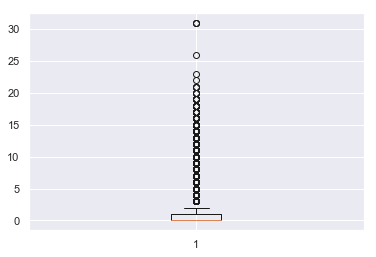

In [40]:
plt.boxplot(openfoodclean['additives_n'])

{'whiskers': [<matplotlib.lines.Line2D at 0x26fb0505a90>,
 'caps': [<matplotlib.lines.Line2D at 0x26fb050e390>,
 'boxes': [<matplotlib.lines.Line2D at 0x26fb0505518>],
 'medians': [<matplotlib.lines.Line2D at 0x26fb050ec50>],
 'fliers': [<matplotlib.lines.Line2D at 0x26fb050ed68>],
 'means': []}

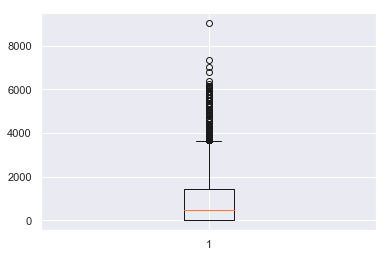

In [41]:
plt.boxplot(openfoodclean['energy_100g'])

{'whiskers': [<matplotlib.lines.Line2D at 0x26fb055dd68>,
 'caps': [<matplotlib.lines.Line2D at 0x26fb0565668>,
 'boxes': [<matplotlib.lines.Line2D at 0x26fb055d7f0>],
 'medians': [<matplotlib.lines.Line2D at 0x26fb0565f28>],
 'fliers': [<matplotlib.lines.Line2D at 0x26fb052ae10>],
 'means': []}

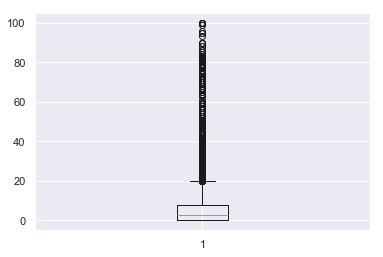

In [42]:
plt.boxplot(openfoodclean['proteins_100g'])

{'whiskers': [<matplotlib.lines.Line2D at 0x26fb05b4d30>,
 'caps': [<matplotlib.lines.Line2D at 0x26fb05bfeb8>,
 'boxes': [<matplotlib.lines.Line2D at 0x26fb05bf080>],
 'medians': [<matplotlib.lines.Line2D at 0x26fb27d67b8>],
 'fliers': [<matplotlib.lines.Line2D at 0x26fb27d6c18>],
 'means': []}

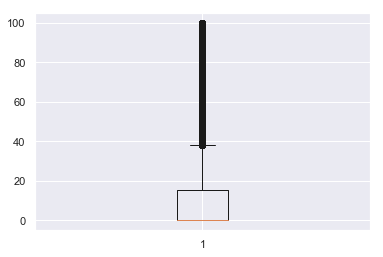

In [43]:
plt.boxplot(openfoodclean['carbohydrates_100g'])

{'whiskers': [<matplotlib.lines.Line2D at 0x26fb2823c50>,
 'caps': [<matplotlib.lines.Line2D at 0x26fb282e550>,
 'boxes': [<matplotlib.lines.Line2D at 0x26fb28236d8>],
 'medians': [<matplotlib.lines.Line2D at 0x26fb282ee10>],
 'fliers': [<matplotlib.lines.Line2D at 0x26fb282ef28>],
 'means': []}

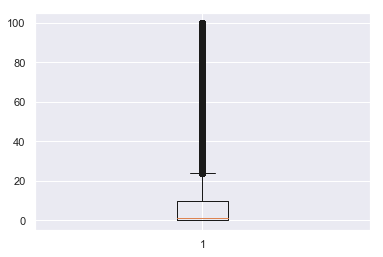

In [44]:
plt.boxplot(openfoodclean['sugars_100g'])

{'whiskers': [<matplotlib.lines.Line2D at 0x26fb2878f98>,
 'caps': [<matplotlib.lines.Line2D at 0x26fb2882898>,
 'boxes': [<matplotlib.lines.Line2D at 0x26fb2878a20>],
 'medians': [<matplotlib.lines.Line2D at 0x26fb2882e10>],
 'fliers': [<matplotlib.lines.Line2D at 0x26fb288b5f8>],
 'means': []}

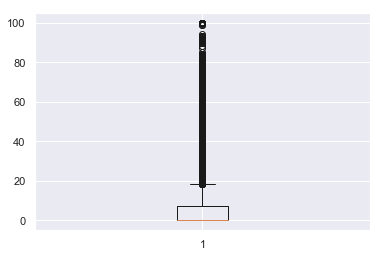

In [45]:
plt.boxplot(openfoodclean['fat_100g'])

{'whiskers': [<matplotlib.lines.Line2D at 0x26fb28cfa20>,
 'caps': [<matplotlib.lines.Line2D at 0x26fb28daba8>,
 'boxes': [<matplotlib.lines.Line2D at 0x26fb28cfd30>],
 'medians': [<matplotlib.lines.Line2D at 0x26fb28e14a8>],
 'fliers': [<matplotlib.lines.Line2D at 0x26fb28e1908>],
 'means': []}

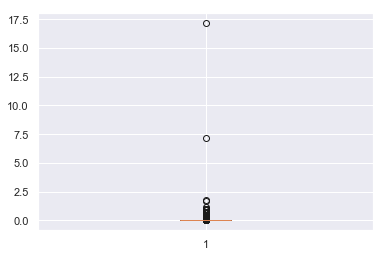

In [46]:
plt.boxplot(openfoodclean['trans-fat_100g'])

{'whiskers': [<matplotlib.lines.Line2D at 0x26fb292ef98>,
 'caps': [<matplotlib.lines.Line2D at 0x26fb2937898>,
 'boxes': [<matplotlib.lines.Line2D at 0x26fb292ea20>],
 'medians': [<matplotlib.lines.Line2D at 0x26fb2937e10>],
 'fliers': [<matplotlib.lines.Line2D at 0x26fb29405f8>],
 'means': []}

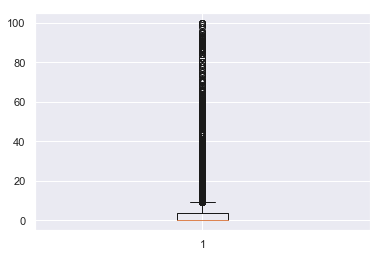

In [47]:
plt.boxplot(openfoodclean['saturated-fat_100g'])

{'whiskers': [<matplotlib.lines.Line2D at 0x26fb2984a20>,
 'caps': [<matplotlib.lines.Line2D at 0x26fb298cba8>,
 'boxes': [<matplotlib.lines.Line2D at 0x26fb2984d30>],
 'medians': [<matplotlib.lines.Line2D at 0x26fb29964a8>],
 'fliers': [<matplotlib.lines.Line2D at 0x26fb2996908>],
 'means': []}

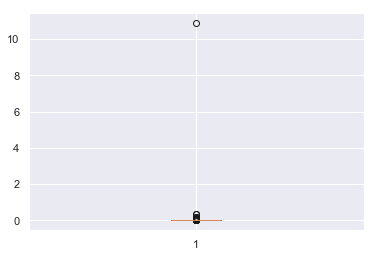

In [48]:
plt.boxplot(openfoodclean['cholesterol_100g'])

{'whiskers': [<matplotlib.lines.Line2D at 0x26fb29d9a58>,
 'caps': [<matplotlib.lines.Line2D at 0x26fb29e3be0>,
 'boxes': [<matplotlib.lines.Line2D at 0x26fb29d9d68>],
 'medians': [<matplotlib.lines.Line2D at 0x26fb29ed4e0>],
 'fliers': [<matplotlib.lines.Line2D at 0x26fb29ed940>],
 'means': []}

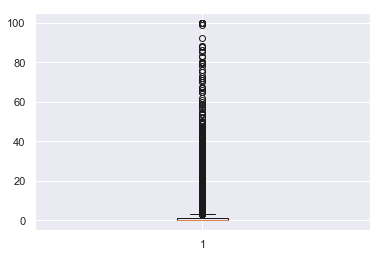

In [49]:
plt.boxplot(openfoodclean['fiber_100g'])

{'whiskers': [<matplotlib.lines.Line2D at 0x26fb2a30cf8>,
 'caps': [<matplotlib.lines.Line2D at 0x26fb2a3ce80>,
 'boxes': [<matplotlib.lines.Line2D at 0x26fb2a3c048>],
 'medians': [<matplotlib.lines.Line2D at 0x26fb2a43780>],
 'fliers': [<matplotlib.lines.Line2D at 0x26fb2a43be0>],
 'means': []}

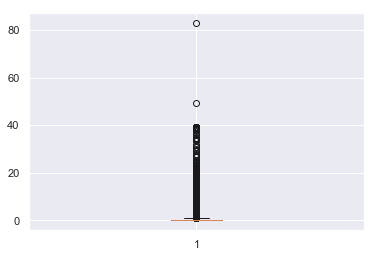

In [50]:
plt.boxplot(openfoodclean['sodium_100g'])

{'whiskers': [<matplotlib.lines.Line2D at 0x26fb3074b38>,
 'caps': [<matplotlib.lines.Line2D at 0x26fb307dcc0>,
 'boxes': [<matplotlib.lines.Line2D at 0x26fb3074e48>],
 'medians': [<matplotlib.lines.Line2D at 0x26fb30855c0>],
 'fliers': [<matplotlib.lines.Line2D at 0x26fb3085a20>],
 'means': []}

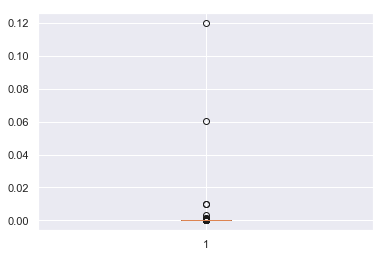

In [51]:
plt.boxplot(openfoodclean['vitamin-a_100g'])

{'whiskers': [<matplotlib.lines.Line2D at 0x26faff46f98>,
 'caps': [<matplotlib.lines.Line2D at 0x26faff56828>,
 'boxes': [<matplotlib.lines.Line2D at 0x26faff56128>],
 'medians': [<matplotlib.lines.Line2D at 0x26faff5c5c0>],
 'fliers': [<matplotlib.lines.Line2D at 0x26faff5cfd0>],
 'means': []}

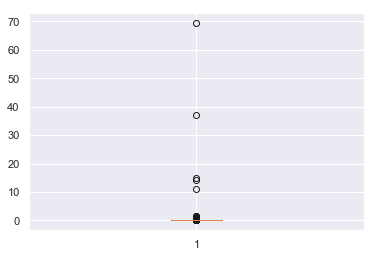

In [52]:
plt.boxplot(openfoodclean['calcium_100g'])

{'whiskers': [<matplotlib.lines.Line2D at 0x26fb048aa90>,
 'caps': [<matplotlib.lines.Line2D at 0x26fb048b2e8>,
 'boxes': [<matplotlib.lines.Line2D at 0x26fb048a4e0>],
 'medians': [<matplotlib.lines.Line2D at 0x26fb048be48>],
 'fliers': [<matplotlib.lines.Line2D at 0x26fb048bfd0>],
 'means': []}

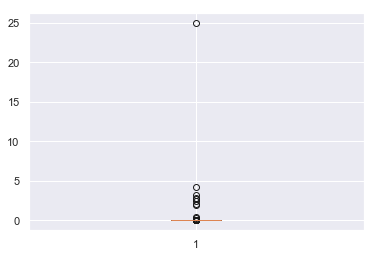

In [53]:
plt.boxplot(openfoodclean['iron_100g'])

{'whiskers': [<matplotlib.lines.Line2D at 0x26fb3170dd8>,
 'caps': [<matplotlib.lines.Line2D at 0x26fb31786d8>,
 'boxes': [<matplotlib.lines.Line2D at 0x26fb3170860>],
 'medians': [<matplotlib.lines.Line2D at 0x26fb3178f98>],
 'fliers': [<matplotlib.lines.Line2D at 0x26fb3180438>],
 'means': []}

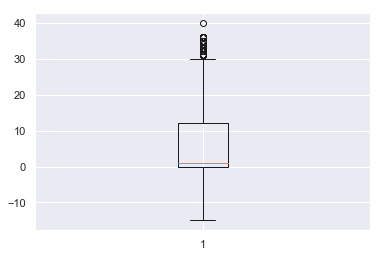

In [54]:
plt.boxplot(openfoodclean['nutrition-score-fr_100g'])

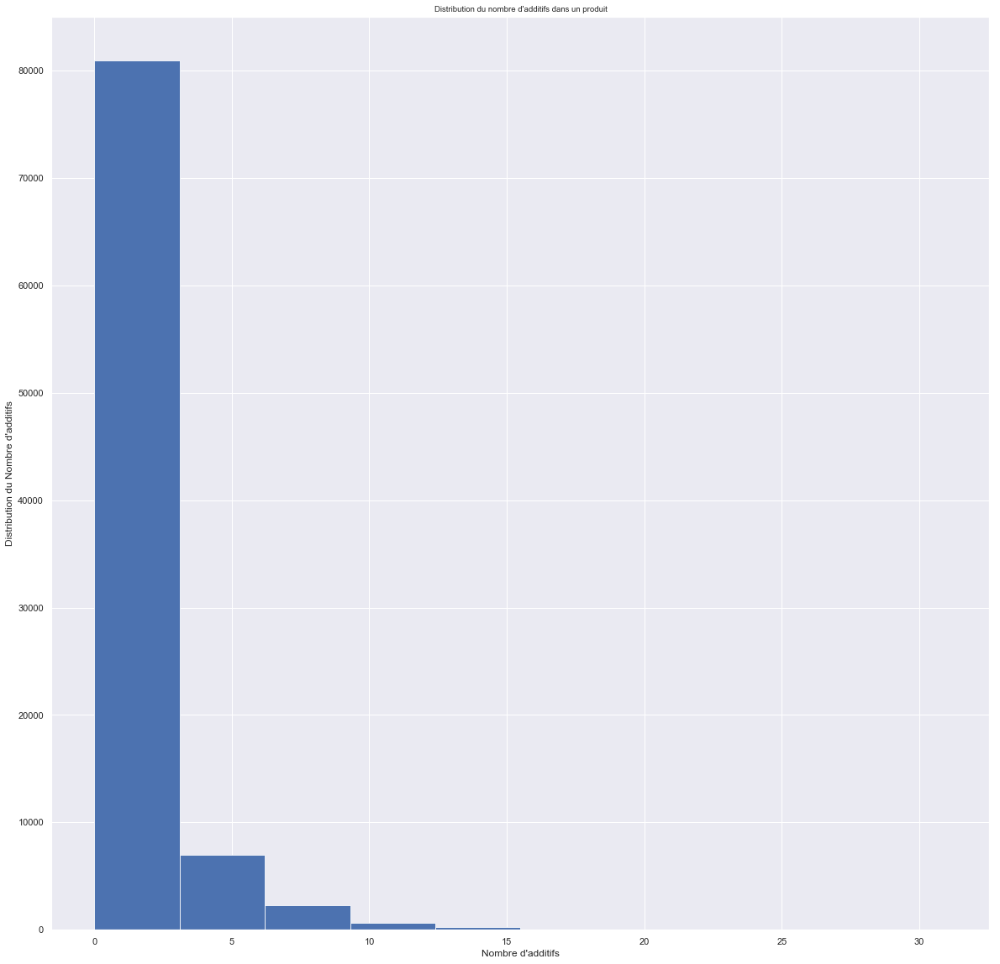

In [55]:
fig, ax = plt.subplots(figsize=(20,20))
sns.set_context("paper", font_scale=1, rc={"lines.linewidth": 1,"font.size":10,"axes.labelsize":10})
plt.title("Distribution du nombre d'additifs dans un produit")
plt.xlabel("Nombre d'additifs")
plt.ylabel("Distribution du Nombre d'additifs")
plt.hist(openfoodclean["additives_n"])
plt.show()

In [56]:
#fig, ax = plt.subplots(figsize=(20,20))
#sns.set_context("paper", font_scale=2, rc={"lines.linewidth": 1,"font.size":10,"axes.labelsize":10})
#additives_by_grade=openfoodclean["additives_n"].groupby(openfoodclean['nutrition_grade_fr'][openfoodclean["nutrition_grade_fr"] != '.'])
#for additive, grade in additives_by_grade:
#    plt.hist(grade, label = "Grade {}".format(additive), alpha = 0.5)
#plt.title("Distribution of additive count by nutrition grade")
#plt.xlabel("Additive count")
#plt.ylabel("Additive count distribution")
#plt.legend()
#plt.show()

In [57]:
num_products_by_category=openfoodclean.categories_fr.groupby(openfoodclean['categories_fr'][openfoodclean["categories_fr"]!='.']).count().sort_values(ascending=False).nlargest(10)

In [58]:
def plot_barh_on_grouped_data(grouped_data,title,y_label,fig_size):
    plt.figure(figsize = fig_size)
    plt.title(title)
    plt.ylabel(y_label)
    plt.barh(range(len(grouped_data)), grouped_data)
    plt.yticks(list(range(len(grouped_data))), grouped_data.index)
    plt.show()

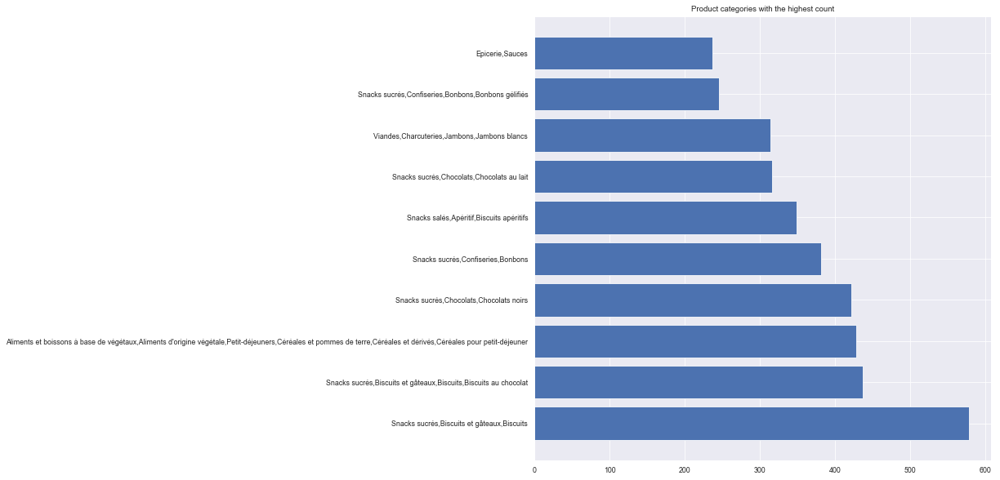

In [59]:
#nombre de produit par catégories
plot_barh_on_grouped_data(num_products_by_category,"Product categories with the highest count","",(10,10))

In [60]:
num_products_by_main_category=openfoodclean.main_category_fr.groupby(openfoodclean['main_category_fr'][openfoodclean["main_category_fr"]!='.']).count().sort_values(ascending=False).nlargest(10)

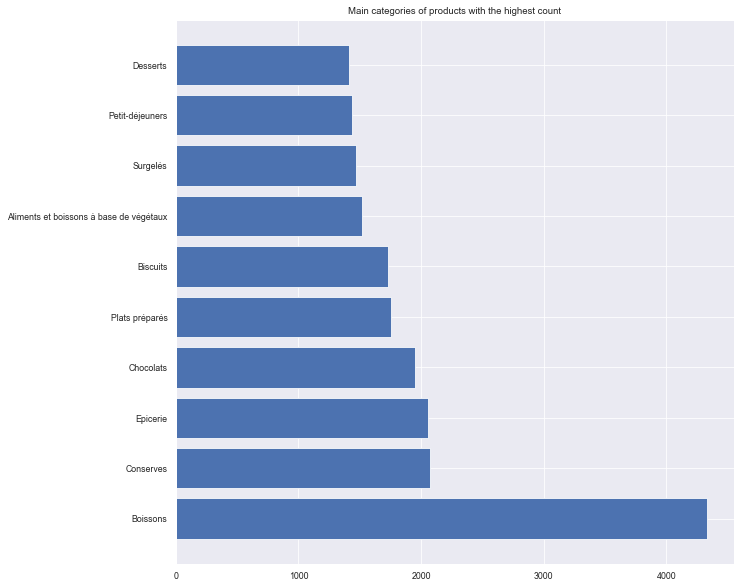

In [61]:
#nombre de produits par catégories principales
plot_barh_on_grouped_data(num_products_by_main_category,"Main categories of products with the highest count","",(10,10))

In [62]:
grades_by_category=openfoodclean.categories_fr.groupby(openfoodclean['nutrition_grade_fr'][openfoodclean["nutrition_grade_fr"]!='.']).count()
grades_by_category

nutrition_grade_fr
a    10163
b     9139
c    13113
d    16902
e    11732
Name: categories_fr, dtype: int64

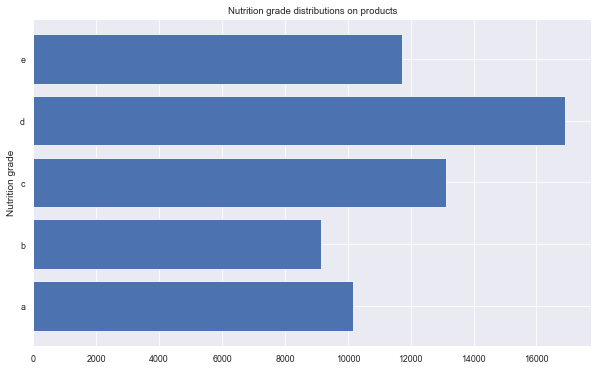

In [63]:
#nombre de produit par note nutritionnelle
plot_barh_on_grouped_data(grades_by_category,"Nutrition grade distributions on products","Nutrition grade",(10,6))

In [64]:
fatprotcarbo=openfoodclean[["product_name","fat_100g","saturated-fat_100g","carbohydrates_100g","proteins_100g","sugars_100g"]]

In [65]:
#matrice de corrélation entre les graisses, les glucides, les protéines et les sucres (macronutriments)
fatprotcarbo.corr()

,fat_100g,saturated-fat_100g,carbohydrates_100g,proteins_100g,sugars_100g
fat_100g,1.00,0.57,0.21,0.23,0.09
saturated-fat_100g,0.57,1.00,0.09,0.27,0.19
carbohydrates_100g,0.21,0.09,1.00,0.10,0.50
proteins_100g,0.23,0.27,0.10,1.00,-0.04
sugars_100g,0.09,0.19,0.50,-0.04,1.00


,fat_100g,saturated-fat_100g,carbohydrates_100g,proteins_100g,sugars_100g
fat_100g,1,0.57,0.21,0.23,0.086
saturated-fat_100g,0.57,1,0.092,0.27,0.19
carbohydrates_100g,0.21,0.092,1,0.098,0.5
proteins_100g,0.23,0.27,0.098,1,-0.037
sugars_100g,0.086,0.19,0.5,-0.037,1


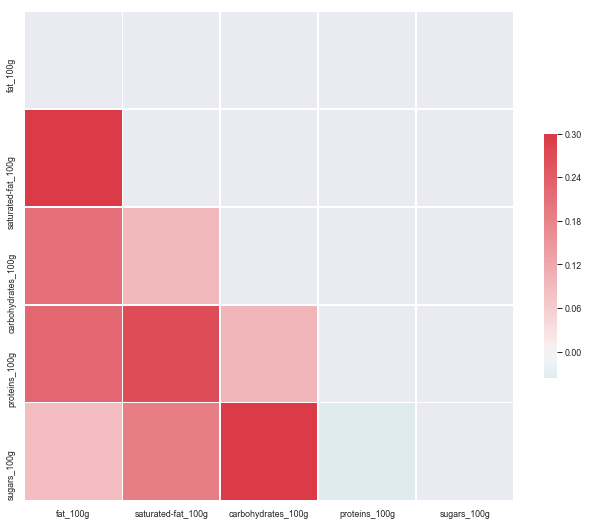

In [66]:
# Compute the correlation matrix
fatprotcarbocorr = fatprotcarbo.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(fatprotcarbocorr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(fatprotcarbocorr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

def magnify():
    return [dict(selector="th",
                 props=[("font-size", "7pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "12pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '200px'),
                        ('font-size', '12pt')])
]

fatprotcarbocorr.style.background_gradient(cmap, axis=1)\
    .set_properties(**{'max-width': '80px', 'font-size': '10pt'})\
    .set_caption("Hover to magify")\
    .set_precision(2)\
    .set_table_styles(magnify())

In [67]:
def get_max_product_values_by_category(dataframe,category):
    #helper function which accepts a dataframe and a product category and returns a grouped dataframe that contains the 10 products that are the richest in that category.
    group_result=category.groupby(dataframe.product_name).max().sort_values(ascending=False).nlargest(10)
    return group_result

In [68]:
np.set_printoptions(threshold=np.nan)
openfoodclean["main_category_fr"].unique()

array(['.', 'Filet-de-boeuf', 'Aliments et boissons à base de végétaux',
       'Sablés', 'Thés', 'Sirops', 'Sodas', 'Sodas aux fruits', 'Gâteaux',
       'Pâtisseries', 'Viandes', 'Poissons et viandes et oeufs',
       'Pate-au-foie-de-canard', 'Condiments', 'Cookies',
       'Plats à base de viande', 'en:Carrot-coriander-soup',
       'en:Charcuteries', 'Soupes', 'Chocolats', 'en:Harengs', 'Boissons',
       'Fromages de vache', 'it:Vinaigre-balsamique', 'Pâtes à tartiner',
       'en:Petit-dejeuners', 'Sandwichs', 'Chips et frites', 'Surgelés',
       'Sauce-aux-piments', 'Epicerie', 'Crustacés', 'Biscuits',
       'en:Vanilla-soymilk', 'Bonbons', 'Snacks salés', 'Fruits à coques',
       'Vinaigres', 'Produits à tartiner', 'Plats préparés', 'Fromages',
       'Nuggets-de-dinde', 'Snacks sucrés', 'Petit-déjeuners', 'Pancake',
       'Conserves', 'en:Coconut-creams', 'Laits', 'Jus de fruits',
       'en:Coconut-waters', 'Beurres', 'Sodas light',
       'Pâtes alimentaires', 'Pain-a-l

In [69]:
french_meat_data=openfoodclean[["product_name","fat_100g","carbohydrates_100g","proteins_100g"]].loc[openfoodclean["main_category_fr"].str.contains("vian",case=False, regex=True)]
french_meat_data

,product_name,fat_100g,carbohydrates_100g,proteins_100g
27,Chair à saucisse,0.00,0.0,0.0
38,Foie gras de canard du Périgord,0.00,0.0,0.0
45,Foie gras canard Périgord,0.00,0.0,0.0
48,Foie de canard aux figues,0.00,0.0,0.0
50,Tartinade de foie gras de canard aux cèpes,0.00,0.0,0.0
51,Foie gras d'oie Périgord,0.00,0.0,0.0
52,Foie gras d'oie du Périgord,0.00,0.0,0.0
63,Chicken pad thaï,0.00,0.0,8.4
123,"grilled Cajun chicken breast, spicy wedges & s...",1.60,7.8,8.9
138,Pulled Pork & Chorizo Feijoada,4.40,16.0,10.0


In [70]:
fat_heavy_meat_products=get_max_product_values_by_category(french_meat_data,french_meat_data.fat_100g)

In [71]:
fat_heavy_meat_products

product_name
Foie gras de canard extra éveiné et assaisonné                    60.0
Foie gras de canard entier au Cognac XO                           59.7
Le foie gras de canard entier du Sud-Ouest cuit au torchon        59.3
Foie gras de canard cru qualité extra spécial terrine             59.2
Foie gras de canard extra Simplissime !                           59.0
Spécial Terrine de Foie Gras à faire soi-même                     59.0
Foie gras de canard entier du Sud-Ouest en lobe                   59.0
Foie gras de Canard entier du Sud-Ouest au Sauternes              59.0
Foie gras de canard extra à cuisiner pour escalopes et terrine    59.0
Foie gras spécial terrine                                         59.0
Name: fat_100g, dtype: float64

In [72]:
french_meat_data.corr()

,fat_100g,carbohydrates_100g,proteins_100g
fat_100g,1.00,-0.04,0.13
carbohydrates_100g,-0.04,1.00,-0.02
proteins_100g,0.13,-0.02,1.00


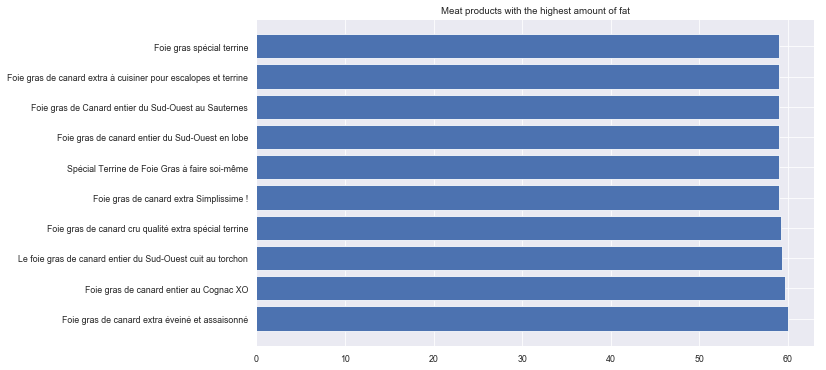

In [73]:
plot_barh_on_grouped_data(fat_heavy_meat_products,"Meat products with the highest amount of fat","",(10,6))

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


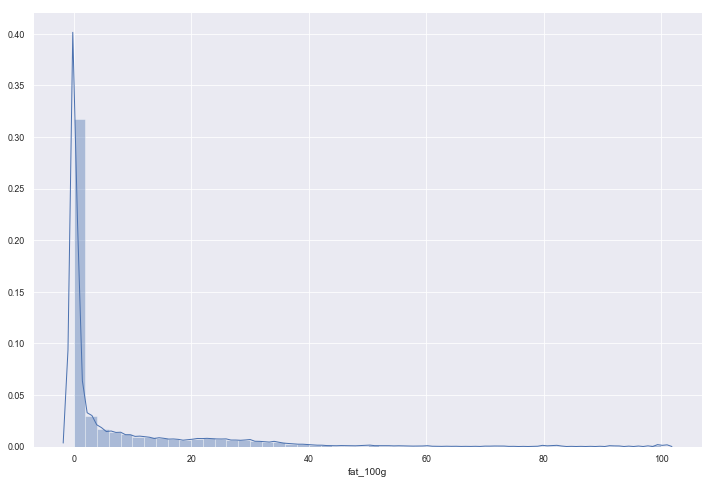

In [74]:
fig = plt.figure(figsize=(12,8))
sns.distplot(openfoodclean['fat_100g'], norm_hist=False,kde=True);

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


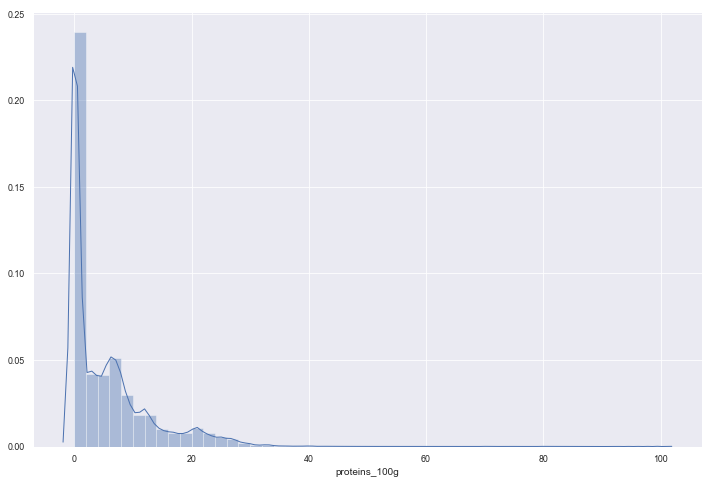

In [75]:
fig = plt.figure(figsize=(12,8))
sns.distplot(openfoodclean['proteins_100g'], kde=True);

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


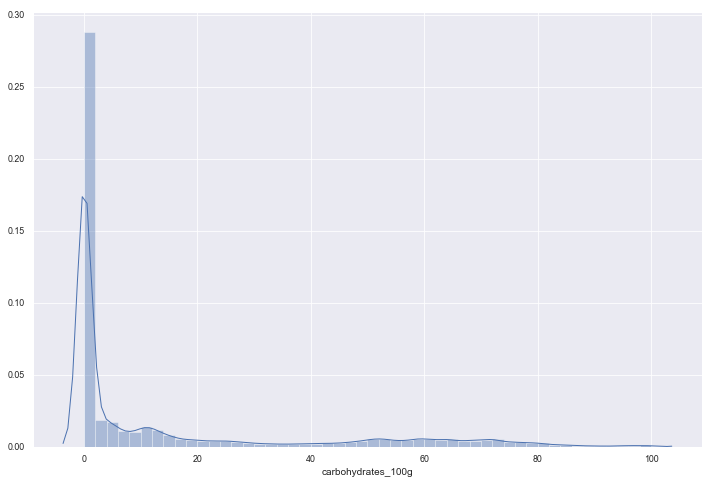

In [76]:
fig = plt.figure(figsize=(12,8))
sns.distplot(openfoodclean['carbohydrates_100g'], kde=True);

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


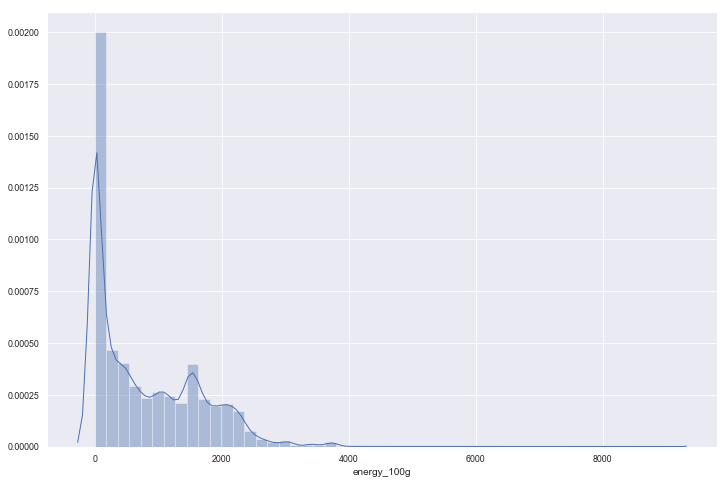

In [77]:
fig = plt.figure(figsize=(12,8))
sns.distplot(openfoodclean['energy_100g'], kde=True);

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


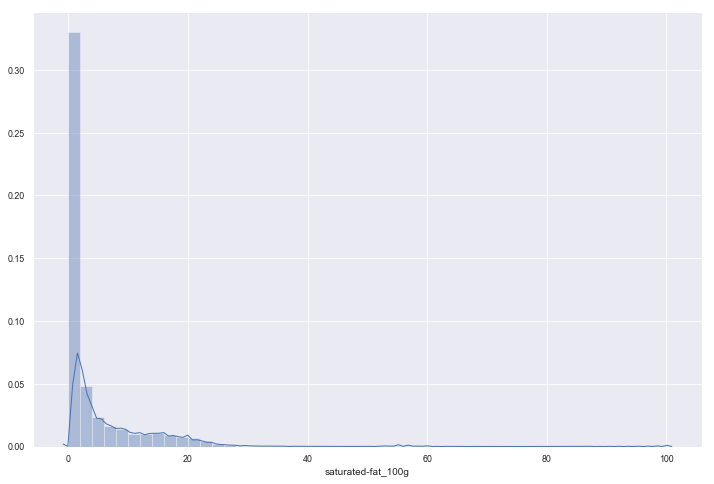

In [78]:
fig = plt.figure(figsize=(12,8))
sns.distplot(openfoodclean['saturated-fat_100g'], kde=True);

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


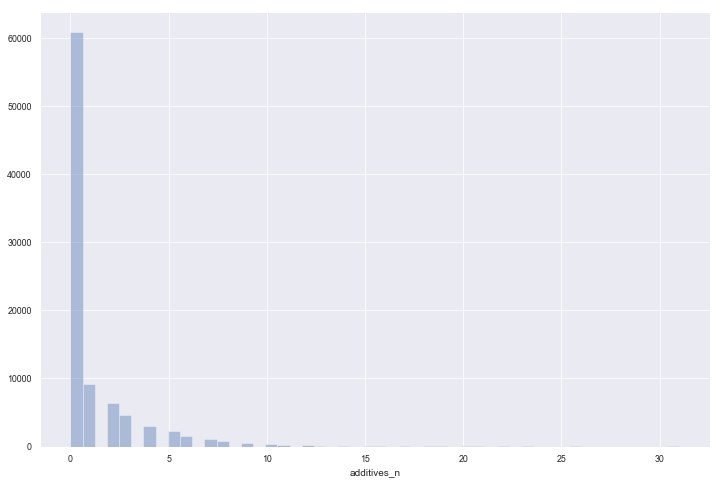

In [79]:
fig = plt.figure(figsize=(12,8))
sns.distplot(openfoodclean['additives_n'], kde=False);

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


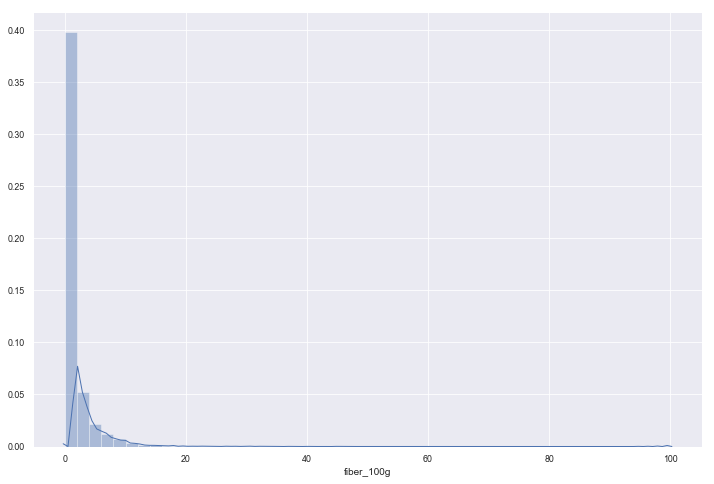

In [80]:
fig = plt.figure(figsize=(12,8))
sns.distplot(openfoodclean['fiber_100g'], kde=True);

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


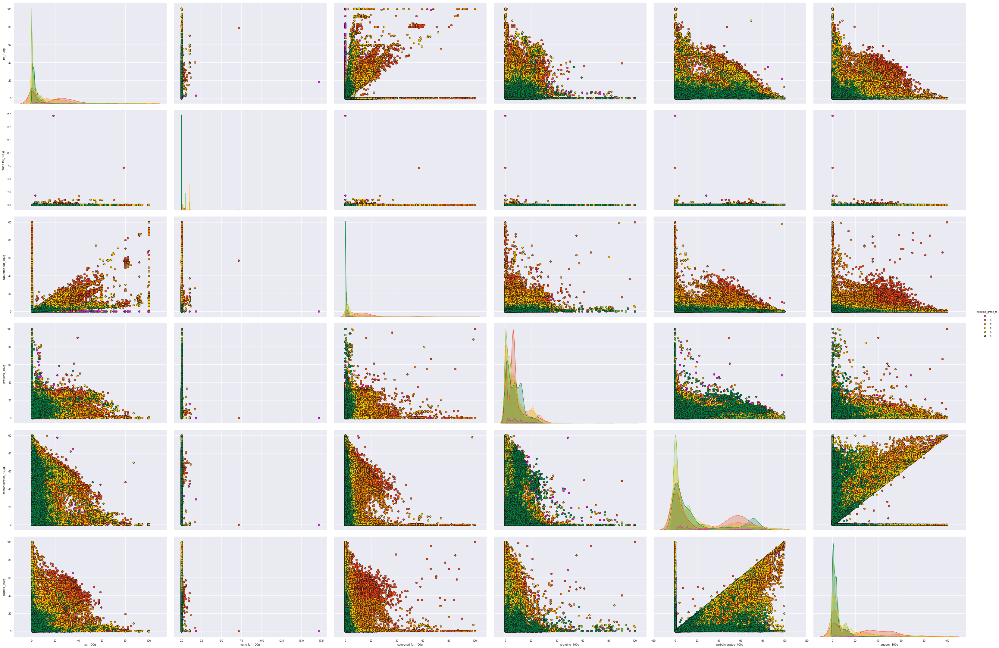

In [81]:
pal = ["#ed0dd9", "#E63E11", "#EE8100", "#FECB02" , "#85BB2F" ,"#038141"]

g = sns.pairplot(openfoodclean, height=5,aspect=1.5,vars=["fat_100g","trans-fat_100g","saturated-fat_100g","proteins_100g","carbohydrates_100g","sugars_100g"],hue="nutrition_grade_fr",hue_order=['.','e','d','c','b','a'],palette=pal,plot_kws=
  {    "s":40,
    "alpha":1.0,
   'lw':0.5,'edgecolor':'k'})

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


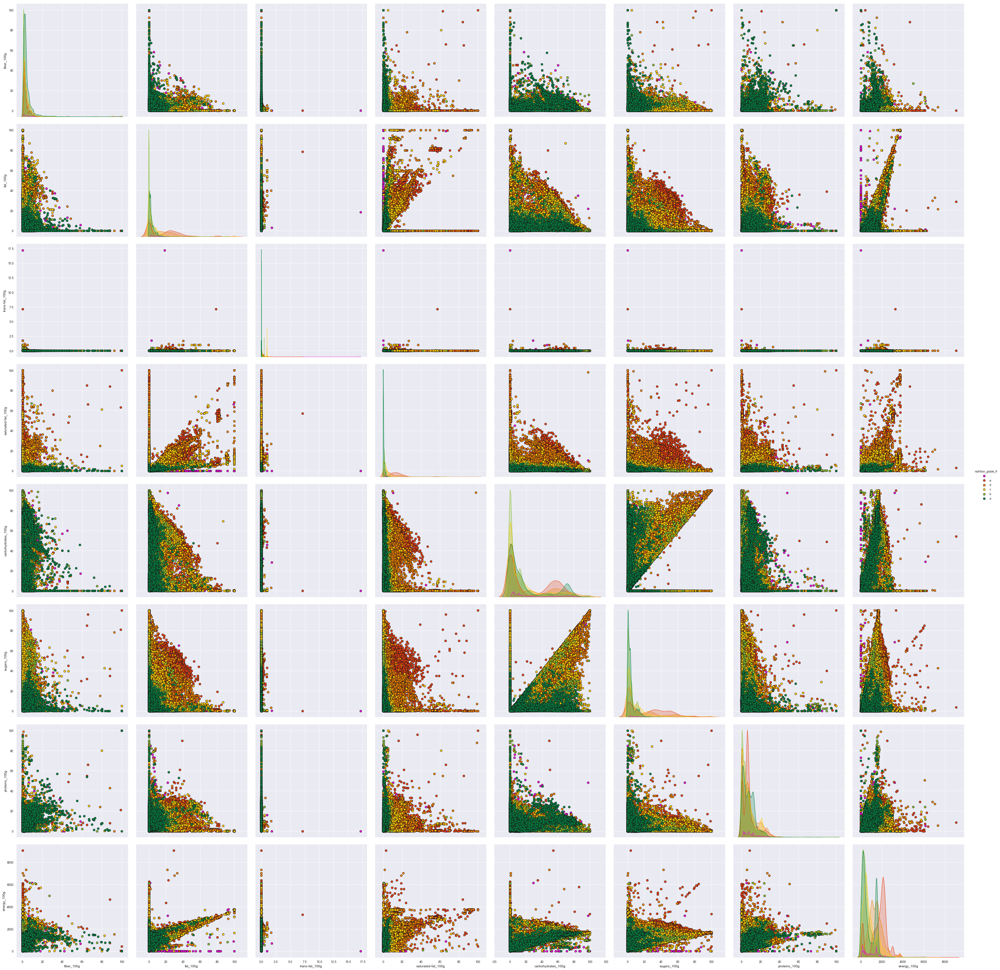

In [108]:
pal = ["#ed0dd9", "#E63E11", "#EE8100", "#FECB02" , "#85BB2F" ,"#038141"]
g = sns.pairplot(openfoodclean, height=5,aspect=1.0, vars=["fiber_100g","fat_100g","trans-fat_100g" ,"saturated-fat_100g","carbohydrates_100g","sugars_100g","proteins_100g","energy_100g"],hue="nutrition_grade_fr",hue_order=['.','e','d','c','b','a'],palette=pal,plot_kws=
    {
    "s":40,
    "alpha":1.0,
    'lw':0.5,
    'edgecolor':'k'
    })

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


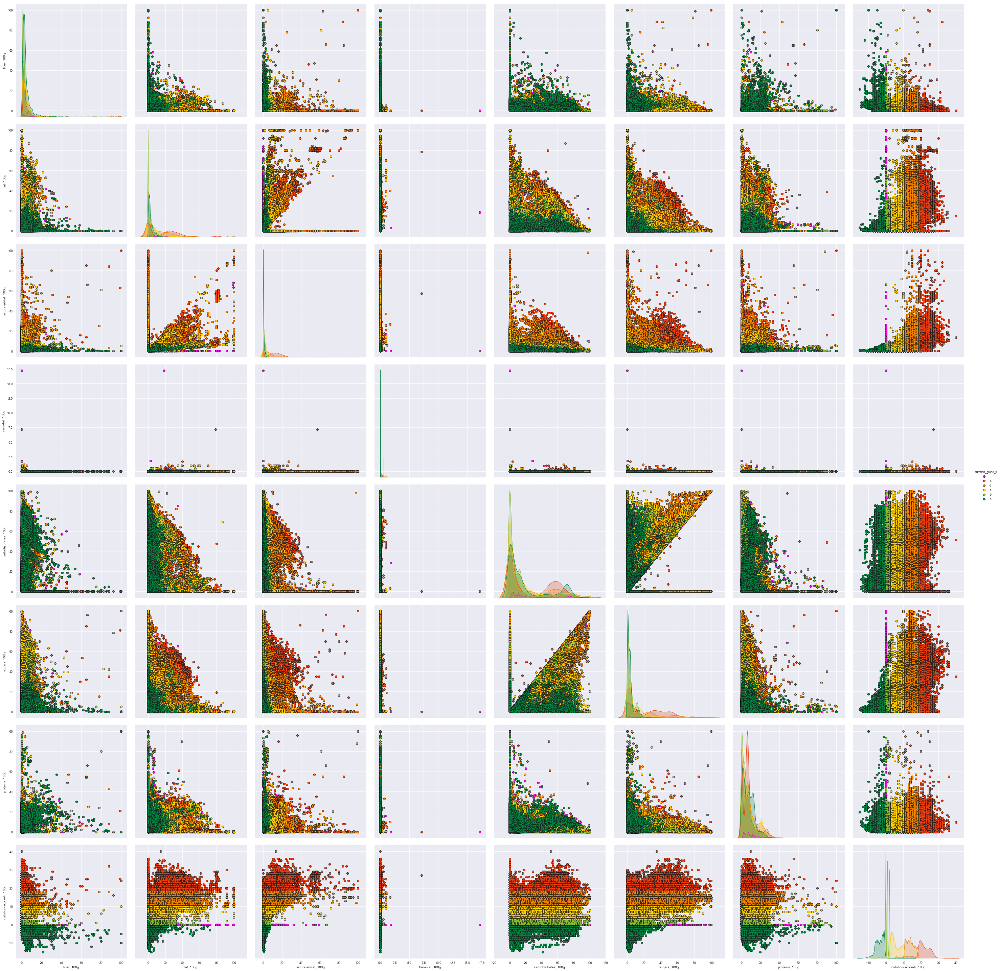

In [107]:
pal = ["#ed0dd9", "#E63E11", "#EE8100", "#FECB02" , "#85BB2F" ,"#038141"]
g = sns.pairplot(openfoodclean, height=5, vars=["fiber_100g","fat_100g","saturated-fat_100g","trans-fat_100g","carbohydrates_100g","sugars_100g","proteins_100g","nutrition-score-fr_100g"],hue="nutrition_grade_fr",hue_order=['.','e','d','c','b','a'],palette=pal,plot_kws=
    {
    "s":40,
    "alpha":1.0,
    'lw':0.5,
    'edgecolor':'k'
    })

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


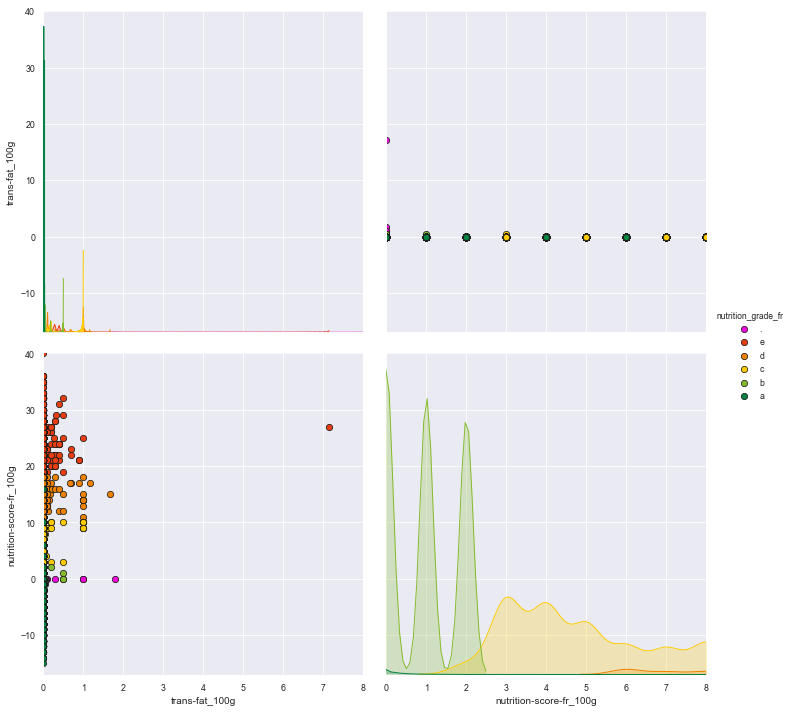

In [92]:
pal = ["#ed0dd9", "#E63E11", "#EE8100", "#FECB02" , "#85BB2F" ,"#038141"]
g = sns.pairplot(openfoodclean, height=5, vars=["trans-fat_100g","nutrition-score-fr_100g"],hue="nutrition_grade_fr",hue_order=['.','e','d','c','b','a'],palette=pal,plot_kws=
    {
    "s":40,
    "alpha":1.0,
    'lw':0.5,
    'edgecolor':'k'
    })
g.set(xlim=(0, 8))
g.set(ylim=(-17, 40))

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


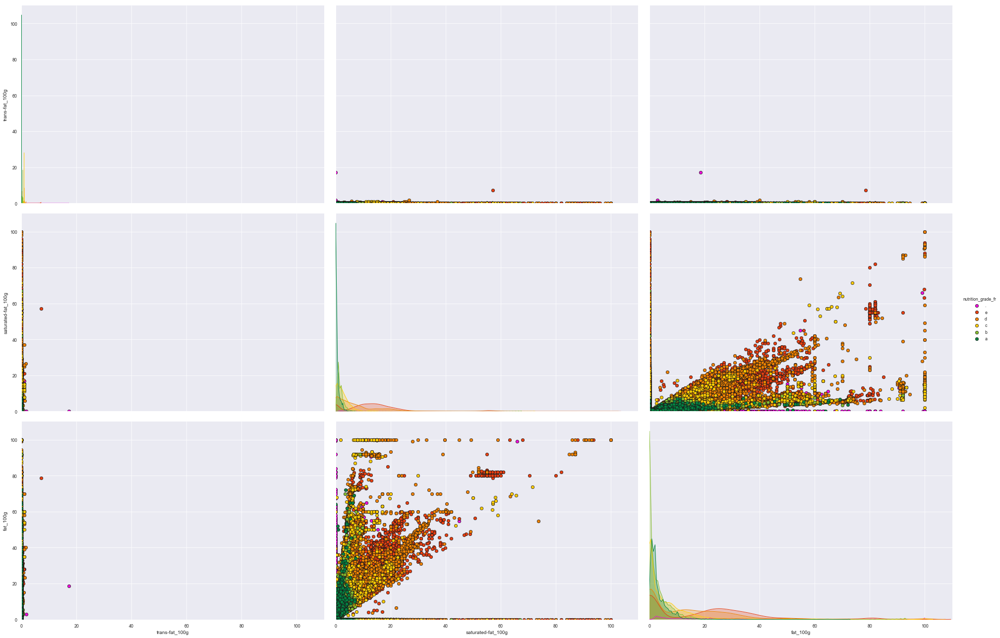

In [106]:
pal = ["#ed0dd9", "#E63E11", "#EE8100", "#FECB02" , "#85BB2F" ,"#038141"]
g = sns.pairplot(openfoodclean, height=6,aspect=1.5, vars=["trans-fat_100g","saturated-fat_100g","fat_100g"],hue="nutrition_grade_fr",hue_order=['.','e','d','c','b','a'],palette=pal,plot_kws=
    {
    "s":40,
    "alpha":1.0,
    'lw':0.5,
    'edgecolor':'k'
    })
g.set(xlim=(0, 110))
g.set(ylim=(0, 110))

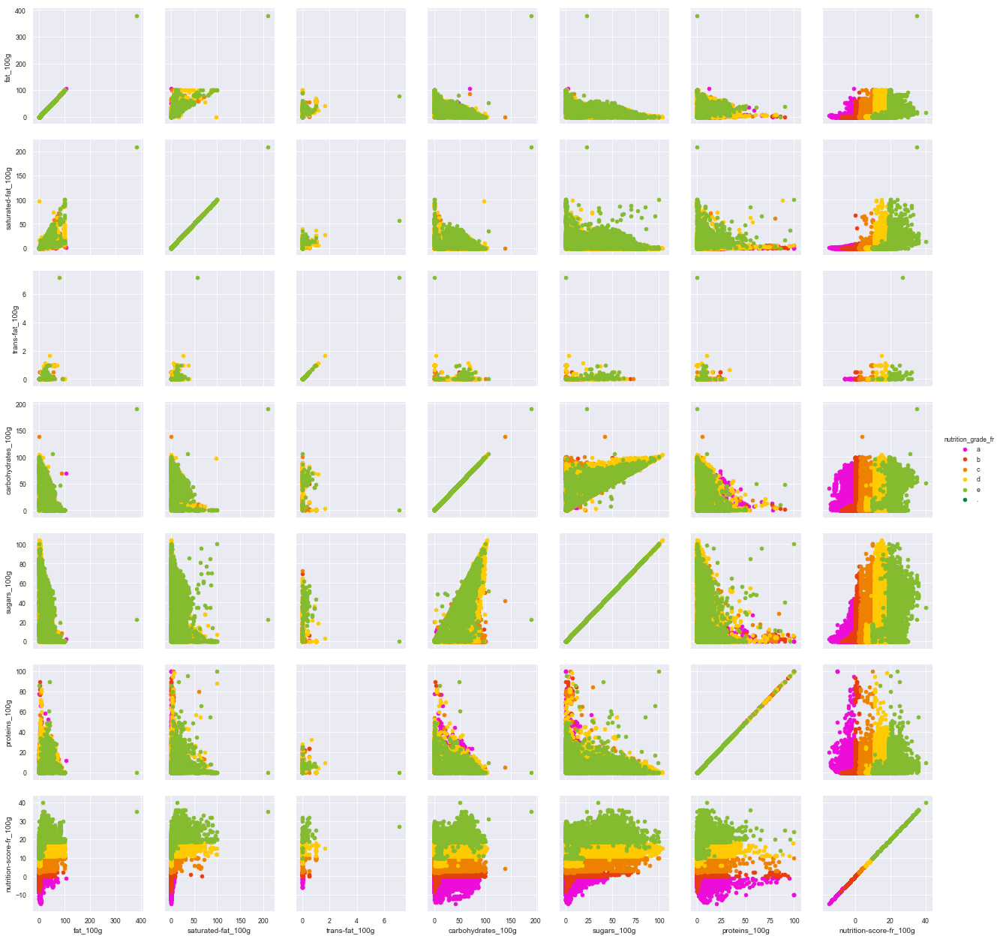

In [84]:
pal = ["#ed0dd9", "#E63E11", "#EE8100", "#FECB02" , "#85BB2F" ,"#038141"]
g = sns.PairGrid(data, vars=["fat_100g","saturated-fat_100g","trans-fat_100g","carbohydrates_100g","sugars_100g","proteins_100g","nutrition-score-fr_100g"],
                 hue='nutrition_grade_fr',hue_order=['a','b','c','d','e','.'], palette=pal)
g.map(plt.scatter, alpha=1)
g.add_legend();

In [85]:
openfoodclean.corr()

,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,fiber_100g,sodium_100g,vitamin-a_100g,calcium_100g,iron_100g,code,additives_n,nutrition-score-fr_100g,energy_100g
proteins_100g,1.00e+00,9.78e-02,-3.65e-02,2.26e-01,2.70e-01,-3.66e-03,1.42e-03,2.30e-01,1.45e-01,-4.00e-03,2.94e-02,4.61e-03,-2.80e-03,4.64e-02,2.83e-01,4.27e-01
carbohydrates_100g,9.78e-02,1.00e+00,4.99e-01,2.12e-01,9.23e-02,2.88e-03,5.90e-03,2.06e-01,-5.69e-03,-2.14e-03,6.58e-03,1.20e-02,-2.29e-03,2.93e-01,2.91e-01,5.00e-01
sugars_100g,-3.65e-02,4.99e-01,1.00e+00,8.65e-02,1.89e-01,1.11e-03,8.11e-03,1.17e-01,-2.42e-02,-2.32e-03,1.34e-03,1.78e-03,-2.09e-03,1.41e-01,5.36e-01,4.44e-01
fat_100g,2.26e-01,2.12e-01,8.65e-02,1.00e+00,5.70e-01,2.80e-02,8.96e-03,5.91e-02,4.03e-02,7.08e-03,1.51e-02,3.73e-03,-1.93e-03,1.60e-01,4.79e-01,6.27e-01
saturated-fat_100g,2.70e-01,9.23e-02,1.89e-01,5.70e-01,1.00e+00,1.86e-02,8.92e-03,7.21e-02,5.51e-02,3.85e-03,1.47e-02,-2.23e-03,-1.91e-03,4.82e-02,6.54e-01,6.13e-01
trans-fat_100g,-3.66e-03,2.88e-03,1.11e-03,2.80e-02,1.86e-02,1.00e+00,8.65e-03,-1.93e-03,4.50e-04,5.33e-03,3.98e-04,-8.04e-05,-5.23e-05,1.47e-02,1.06e-02,1.29e-02
cholesterol_100g,1.42e-03,5.90e-03,8.11e-03,8.96e-03,8.92e-03,8.65e-03,1.00e+00,7.44e-04,-3.95e-04,2.59e-04,4.39e-04,5.51e-03,-1.94e-05,1.45e-05,8.52e-03,7.61e-03
fiber_100g,2.30e-01,2.06e-01,1.17e-01,5.91e-02,7.21e-02,-1.93e-03,7.44e-04,1.00e+00,3.74e-02,-2.00e-03,3.84e-03,6.78e-03,-1.42e-03,-1.89e-02,-1.83e-02,2.72e-01
sodium_100g,1.45e-01,-5.69e-03,-2.42e-02,4.03e-02,5.51e-02,4.50e-04,-3.95e-04,3.74e-02,1.00e+00,-9.91e-04,1.19e-04,1.04e-03,-8.51e-04,2.82e-02,1.46e-01,6.83e-02
vitamin-a_100g,-4.00e-03,-2.14e-03,-2.32e-03,7.08e-03,3.85e-03,5.33e-03,2.59e-04,-2.00e-03,-9.91e-04,1.00e+00,8.05e-02,4.84e-03,-3.35e-05,2.16e-02,1.02e-03,7.68e-04


,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,fiber_100g,sodium_100g,vitamin-a_100g,calcium_100g,iron_100g,code,additives_n,nutrition-score-fr_100g,energy_100g
proteins_100g,1,0.098,-0.037,0.23,0.27,-0.0037,0.0014,0.23,0.14,-0.004,0.029,0.0046,-0.0028,0.046,0.28,0.43
carbohydrates_100g,0.098,1,0.5,0.21,0.092,0.0029,0.0059,0.21,-0.0057,-0.0021,0.0066,0.012,-0.0023,0.29,0.29,0.5
sugars_100g,-0.037,0.5,1,0.086,0.19,0.0011,0.0081,0.12,-0.024,-0.0023,0.0013,0.0018,-0.0021,0.14,0.54,0.44
fat_100g,0.23,0.21,0.086,1,0.57,0.028,0.009,0.059,0.04,0.0071,0.015,0.0037,-0.0019,0.16,0.48,0.63
saturated-fat_100g,0.27,0.092,0.19,0.57,1,0.019,0.0089,0.072,0.055,0.0039,0.015,-0.0022,-0.0019,0.048,0.65,0.61
trans-fat_100g,-0.0037,0.0029,0.0011,0.028,0.019,1,0.0086,-0.0019,0.00045,0.0053,0.0004,-8e-05,-5.2e-05,0.015,0.011,0.013
cholesterol_100g,0.0014,0.0059,0.0081,0.009,0.0089,0.0086,1,0.00074,-0.0004,0.00026,0.00044,0.0055,-1.9e-05,1.5e-05,0.0085,0.0076
fiber_100g,0.23,0.21,0.12,0.059,0.072,-0.0019,0.00074,1,0.037,-0.002,0.0038,0.0068,-0.0014,-0.019,-0.018,0.27
sodium_100g,0.14,-0.0057,-0.024,0.04,0.055,0.00045,-0.0004,0.037,1,-0.00099,0.00012,0.001,-0.00085,0.028,0.15,0.068
vitamin-a_100g,-0.004,-0.0021,-0.0023,0.0071,0.0039,0.0053,0.00026,-0.002,-0.00099,1,0.081,0.0048,-3.3e-05,0.022,0.001,0.00077


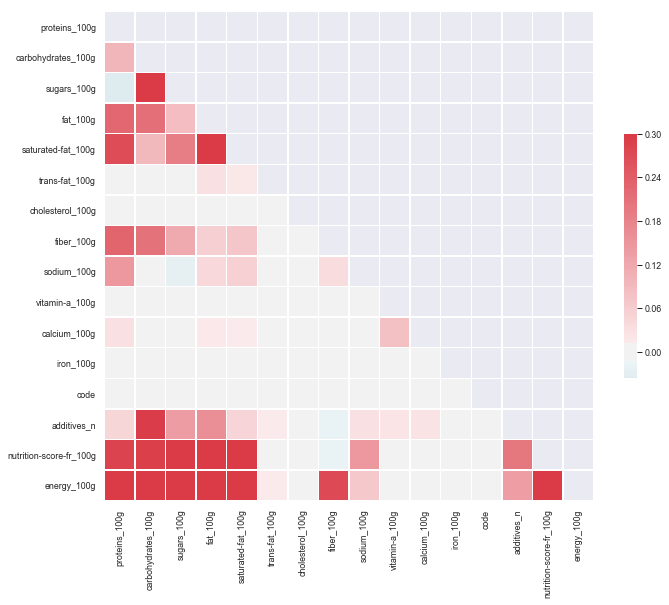

In [86]:
# Compute the correlation matrix
opencorr = openfoodclean.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(opencorr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(opencorr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

def magnify():
    return [dict(selector="th",
                 props=[("font-size", "7pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "12pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '200px'),
                        ('font-size', '12pt')])
]

opencorr.style.background_gradient(cmap, axis=1)\
    .set_properties(**{'max-width': '80px', 'font-size': '10pt'})\
    .set_caption("Hover to magify")\
    .set_precision(2)\
    .set_table_styles(magnify())